# 01 • Run `cpsam_v2` on RGB soft-stitched windows
This notebook reads prepared tiles from notebook 00. It does not require the original
SpatialData objects to remain in RAM. The exact checkpoint path, SHA-256 digest, Cellpose
version, parameters, preprocessing and per-run runtime are saved.

The primary test is **direct RGB → cpsam_v2 segmentation**. Proseg is deliberately separate
so we can determine whether the new image model itself improves the boundaries.

In [1]:
from pathlib import Path
import sys
import importlib
import numpy as np
import pandas as pd

# Keep this notebook, pilot_config.json and cosmx_rgb_pilot.py together.
HERE = Path.cwd()
if not (HERE / "cosmx_rgb_pilot.py").exists():
    raise FileNotFoundError("Set HERE to the extracted notebook bundle directory.")
if str(HERE) not in sys.path:
    sys.path.insert(0, str(HERE))
import cosmx_rgb_pilot as pilot
importlib.reload(pilot)
CONFIG_PATH = HERE / "pilot_config.json"
config = pilot.read_json(CONFIG_PATH)
OUTPUT_ROOT = Path(config["output_root"])
for sample_spec in config["samples"].values():
    source_path = Path(sample_spec["source_zarr"]).resolve()
    output_path = OUTPUT_ROOT.resolve()
    if output_path == source_path or source_path in output_path.parents or output_path in source_path.parents:
        raise ValueError("The pilot output root must be separate from every source Zarr.")
OUTPUT_ROOT.mkdir(parents=True, exist_ok=True)
print("Output root:", OUTPUT_ROOT)

Output root: /host_root/nethome/reny28/Projects/CosMX_projects/P06364_CRC_DS20250227_48371/tmp/DS-20250227-48371/cpsam_v2_rgb_softstitch_pilot_v1


### 1. Inspect the experiment matrix
All active variants use the same 700-pixel minimum mask area at native resolution, to start
from your previous size cutoff. This is **not** Cellpose's library default size cutoff and
must be reviewed for small whole cells. `balanced` uses 0.4 / 0.0 thresholds;
`legacy_thresholds` uses your 0.9 / -2.0 pair. Neither is presumed optimal on these samples.

The blue-channel repeat control isolates RGB input effects under the same model and permissive
thresholds. The original `cpsam` checkpoint comparison is provided but disabled by default.
RGB values remain the measured composite channels: no inferred CD45/PanCK channels and no
engineered edge maps are substituted.

Normalization happens once per channel on acquired pixels. Black canvas gaps do not determine
the percentiles. This is intentionally reproducible, rather than copying uncertain old notebook
preprocessing state.

In [2]:
variant_table = pd.DataFrame([
    {"name": v["name"], "model": v["model"], "input": v["input_mode"], "enabled": v["enabled"], **v["params"]}
    for v in config["variants"]
])
display(variant_table)
print(pilot.require_cuda(config["gpu_device"]))
for sample in config["samples"]:
    print(sample, sorted(p.parent.name for p in (OUTPUT_ROOT / sample / "tiles").glob("*/complete.json")))

,name,model,input,enabled,flow_threshold,cellprob_threshold,min_size
0,rgb_v2_balanced,cpsam_v2,rgb,True,0.4,0.0,700
1,rgb_v2_legacy_thresholds,cpsam_v2,rgb,True,0.9,-2.0,700
2,blue_v2_legacy_thresholds,cpsam_v2,blue_repeat,True,0.9,-2.0,700
3,rgb_original_cpsam,cpsam,rgb,False,0.9,-2.0,700


{'device': 'cuda:0', 'name': 'NVIDIA A10G', 'free_gib': 21.76312255859375, 'total_gib': 22.0582275390625}
B20317610105_colon ['pilot_00_vertical_seam', 'pilot_01_horizontal_seam', 'pilot_02_four_fov_junction', 'pilot_03_dense_interior']
B20971880114_colon ['pilot_00_vertical_seam', 'pilot_01_horizontal_seam', 'pilot_02_four_fov_junction', 'pilot_03_dense_interior']


### 2. Initial smoke run: one tile per sample, both RGB settings
The first model initialization may download weights. A requested but unavailable checkpoint
is an error; the code will not silently load a different default model. A missing CUDA device
also stops the run rather than falling back to CPU.

The output-directory cache is keyed by model checksum, input configuration and tile signature.
An incomplete directory is not regarded as a successful run merely because it exists.

In [3]:
smoke_manifest = pilot.batch_cellpose(
    config,
    max_tiles_per_sample=1,
    variant_names=["rgb_v2_balanced", "rgb_v2_legacy_thresholds"],
)
display(smoke_manifest)

[model] {'model': 'cpsam_v2', 'checkpoint': '/home/domino/.cellpose/models/cpsam_v2', 'checkpoint_sha256': '0f1cc3f7ecdd8a037a57c6c48d9d8921391be4cbce3fa9f13c3e3a2e1253c667', 'cellpose_version': '4.2.1', 'gpu': {'device': 'cuda:0', 'name': 'NVIDIA A10G', 'free_gib': 21.76312255859375, 'total_gib': 22.0582275390625}}


/home/domino/reny28/Projects/CosMX_projects/P06364_CRC_DS20250227_48371/env/gpu_env/.venv/lib/python3.13/site-packages/cellpose/dynamics.py:541: UserWarning: Sparse invariant checks are implicitly disabled. Memory errors (e.g. SEGFAULT) will occur when operating on a sparse tensor which violates the invariants, but checks incur performance overhead. To silence this warning, explicitly opt in or out. See `torch.sparse.check_sparse_tensor_invariants.__doc__` for guidance.  (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:760.)
  coo = torch.sparse_coo_tensor(pt, torch.ones(pt.shape[1], device=pt.device, dtype=torch.int),


[Cellpose] rgb_v2_balanced | 53.4s | /host_root/nethome/reny28/Projects/CosMX_projects/P06364_CRC_DS20250227_48371/tmp/DS-20250227-48371/cpsam_v2_rgb_softstitch_pilot_v1/B20317610105_colon/tiles/pilot_00_vertical_seam/methods/rgb_v2_balanced
[Cellpose] rgb_v2_legacy_thresholds | 27.7s | /host_root/nethome/reny28/Projects/CosMX_projects/P06364_CRC_DS20250227_48371/tmp/DS-20250227-48371/cpsam_v2_rgb_softstitch_pilot_v1/B20317610105_colon/tiles/pilot_00_vertical_seam/methods/rgb_v2_legacy_thresholds
[Cellpose] rgb_v2_balanced | 28.0s | /host_root/nethome/reny28/Projects/CosMX_projects/P06364_CRC_DS20250227_48371/tmp/DS-20250227-48371/cpsam_v2_rgb_softstitch_pilot_v1/B20971880114_colon/tiles/pilot_00_vertical_seam/methods/rgb_v2_balanced
[Cellpose] rgb_v2_legacy_thresholds | 30.7s | /host_root/nethome/reny28/Projects/CosMX_projects/P06364_CRC_DS20250227_48371/tmp/DS-20250227-48371/cpsam_v2_rgb_softstitch_pilot_v1/B20971880114_colon/tiles/pilot_00_vertical_seam/methods/rgb_v2_legacy_thresho

,sample,tile,method,outdir,elapsed_seconds
0,B20317610105_colon,pilot_00_vertical_seam,rgb_v2_balanced,/host_root/nethome/reny28/Projects/CosMX_proje...,53.423712
1,B20317610105_colon,pilot_00_vertical_seam,rgb_v2_legacy_thresholds,/host_root/nethome/reny28/Projects/CosMX_proje...,27.671434
2,B20971880114_colon,pilot_00_vertical_seam,rgb_v2_balanced,/host_root/nethome/reny28/Projects/CosMX_proje...,28.014833
3,B20971880114_colon,pilot_00_vertical_seam,rgb_v2_legacy_thresholds,/host_root/nethome/reny28/Projects/CosMX_proje...,30.741290


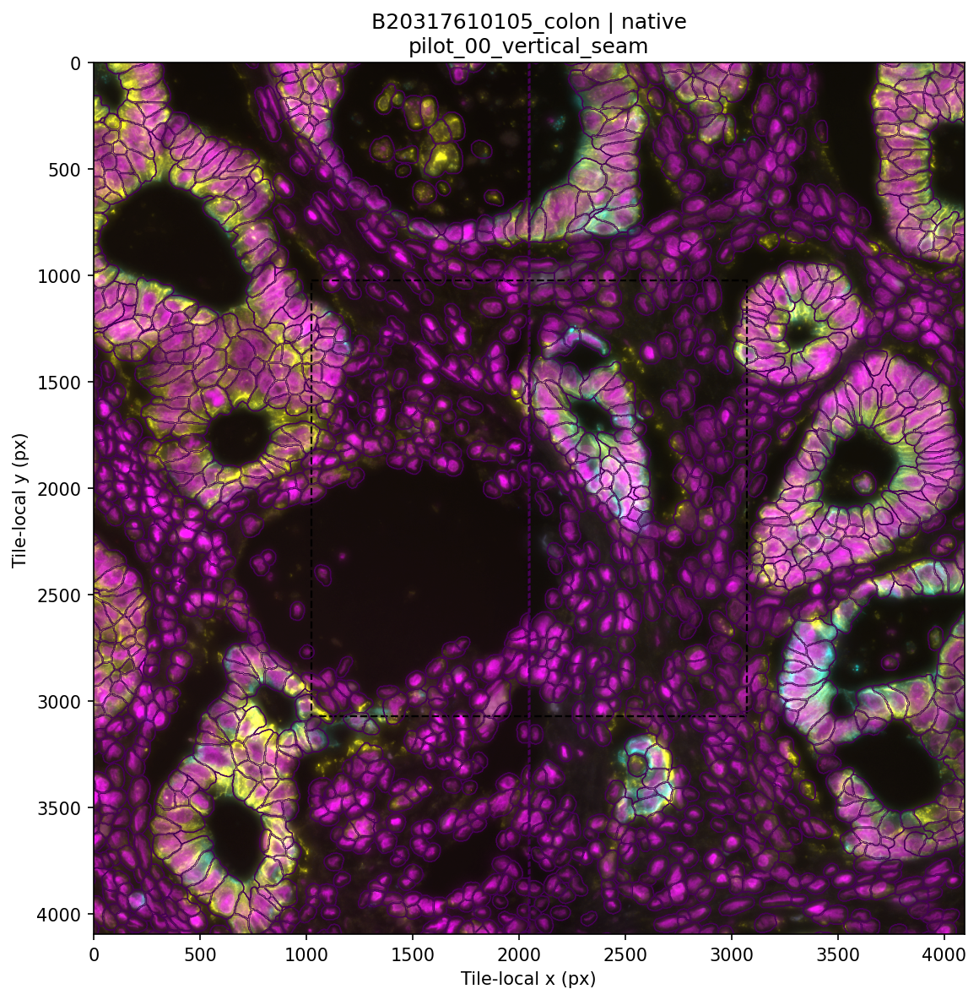

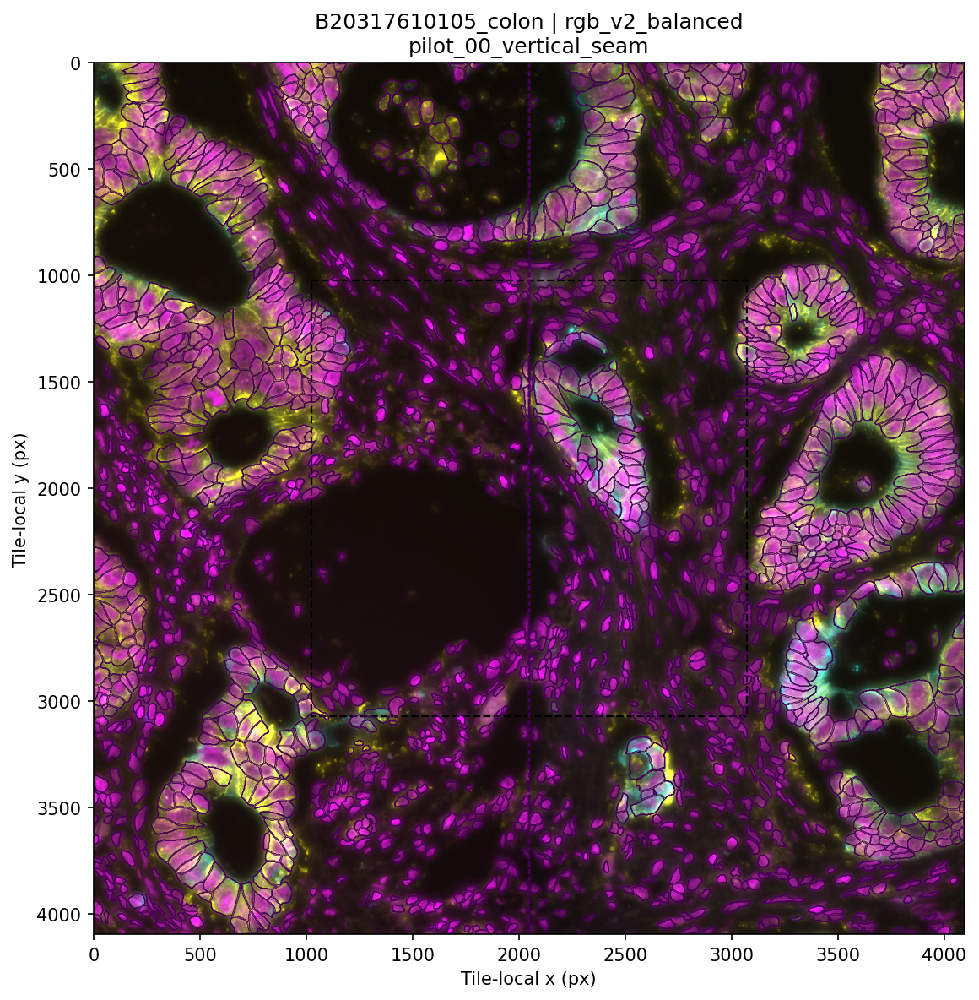

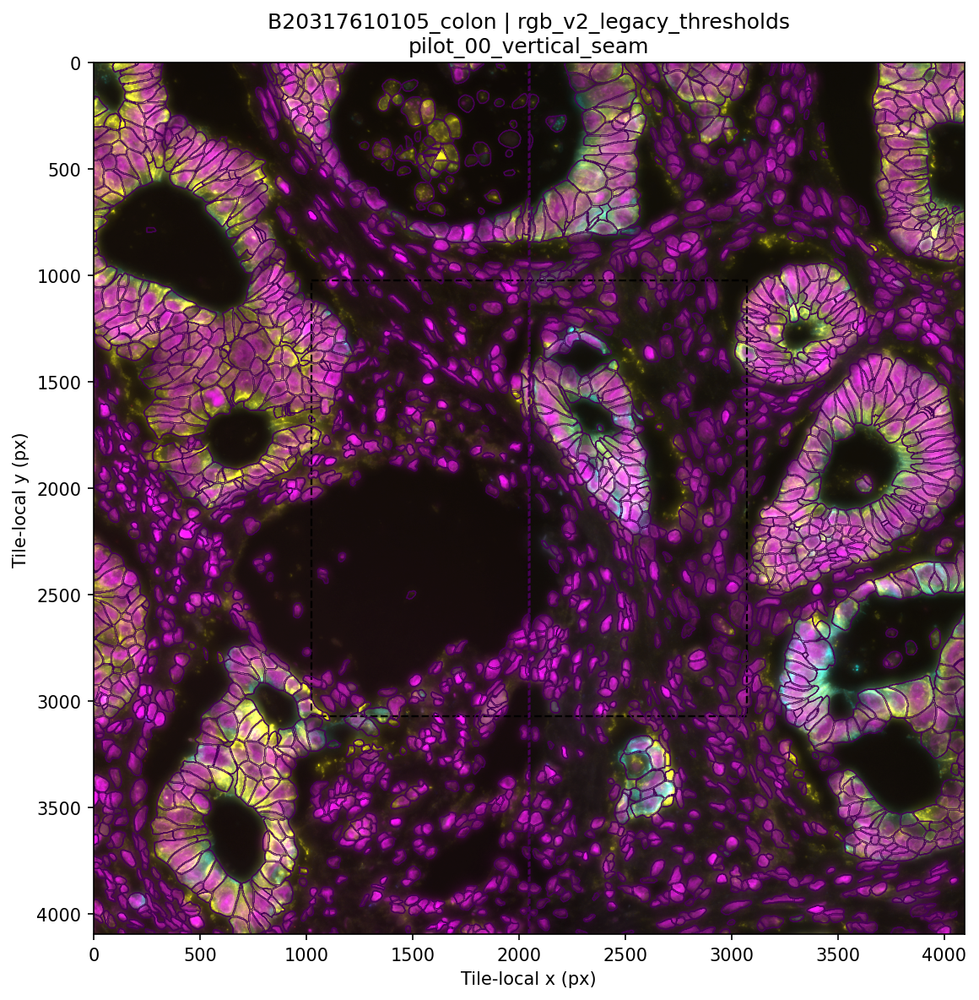

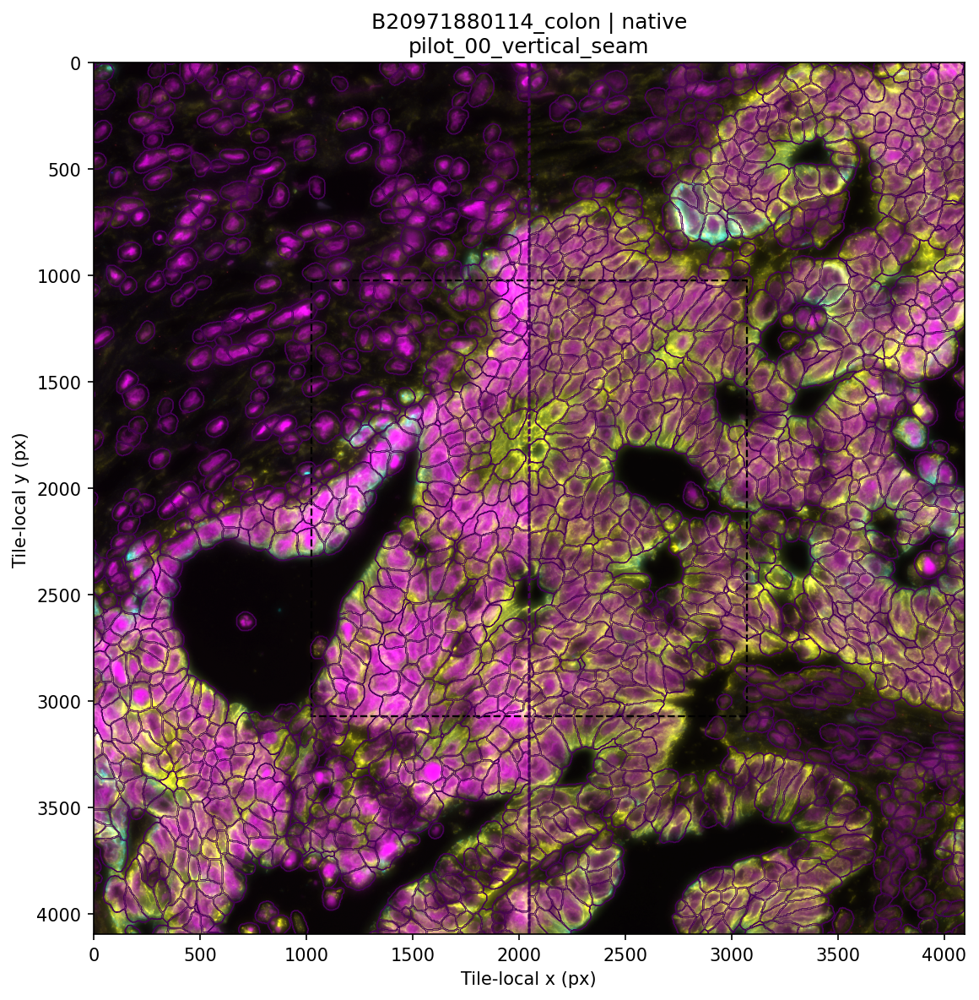

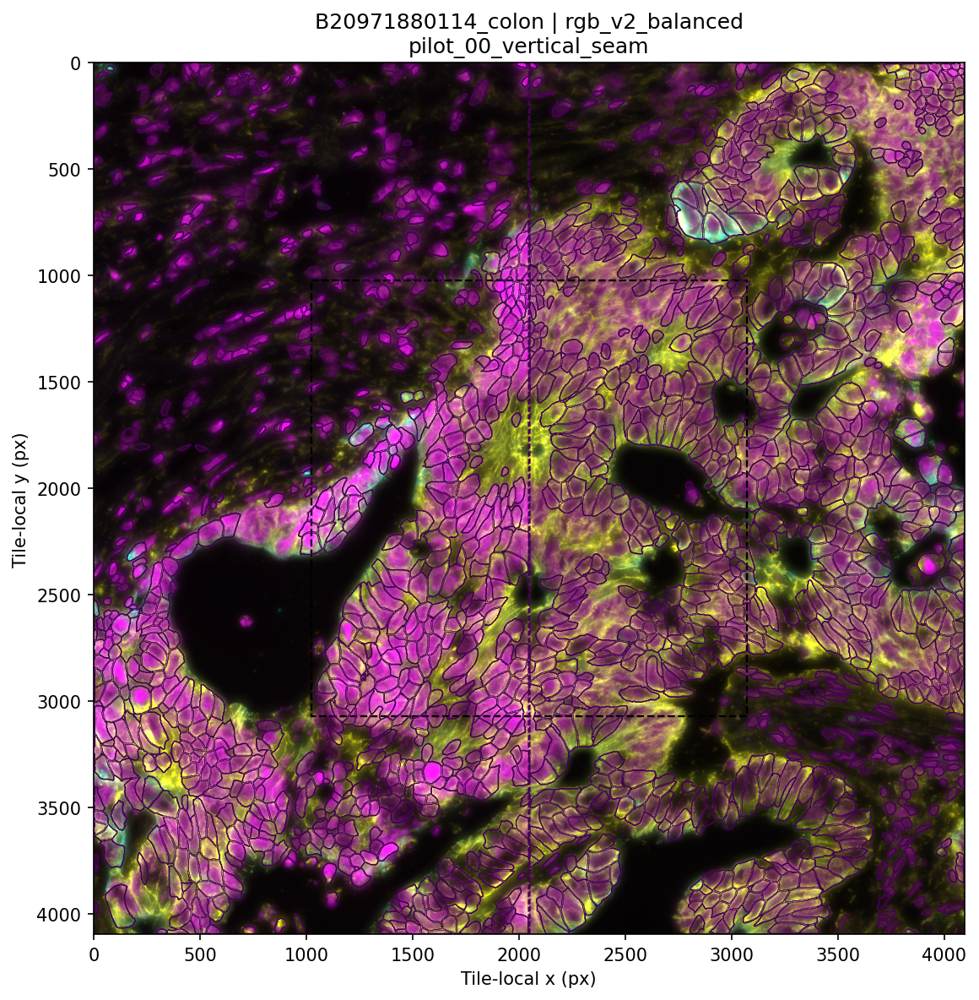

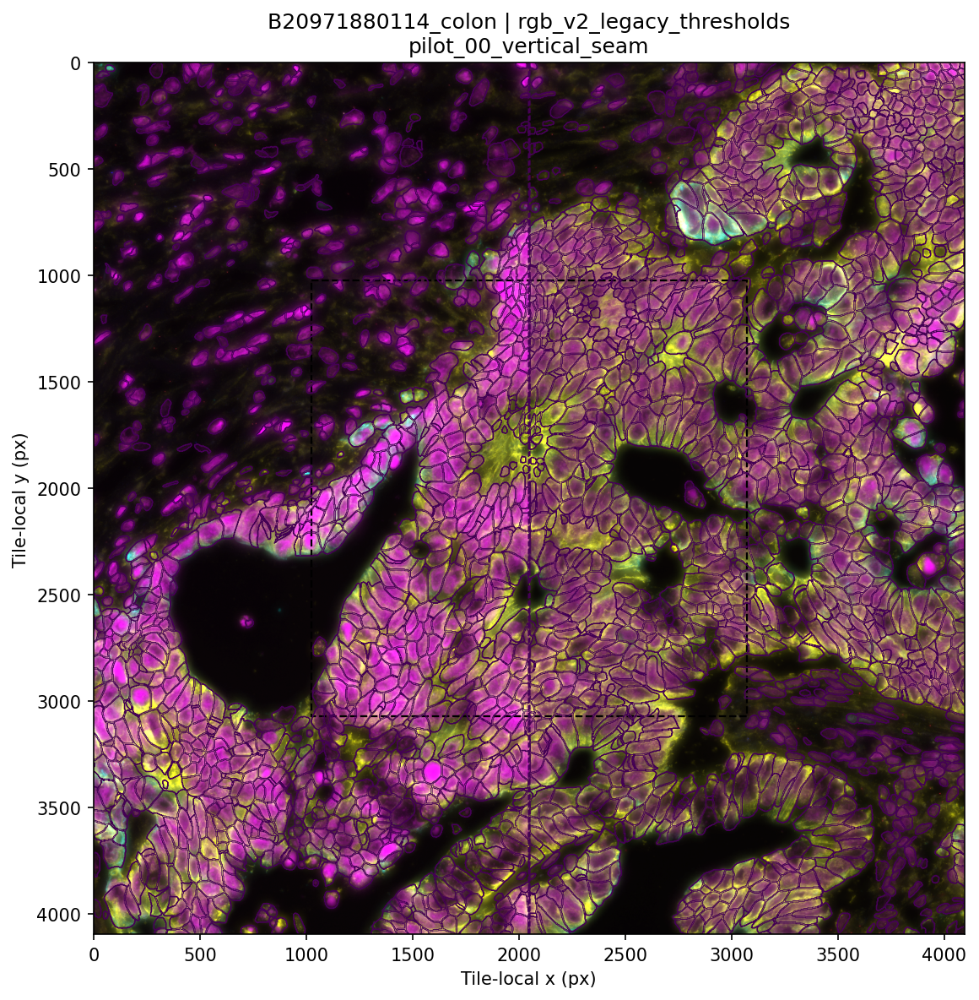

In [4]:
for sample in config["samples"]:
    tile_path = sorted(p.parent for p in (OUTPUT_ROOT / sample / "tiles").glob("*/complete.json"))[0]
    for method in ["native", "rgb_v2_balanced", "rgb_v2_legacy_thresholds"]:
        pilot.plot_tile(tile_path, method=method)
# Pixel-level close-ups use the identical tile-local box for each method:
# pilot.plot_tile(tile_path, "native", crop=(1400, 1400, 2400, 2400))
# pilot.plot_tile(tile_path, "rgb_v2_legacy_thresholds", crop=(1400, 1400, 2400, 2400))

### 3. Run the selected pilot panel
By default this is up to four tiles per sample and three active variants. Completed matching
runs are reused. One model is reused across tiles; different backbones are not accumulated on
one GPU. Keep the batch size at 4 initially, then increase only after measuring VRAM use.
This notebook is sequential; no multiprocessing is started inside the CUDA-initialized kernel.

In [7]:
RUN_ALL_PILOT_TILES = True  # Set True after examining the two-sample smoke run.
if RUN_ALL_PILOT_TILES:
    full_manifest = pilot.batch_cellpose(config)
    display(full_manifest)
else:
    print("Full pilot panel not requested yet.")

[model] {'model': 'cpsam_v2', 'checkpoint': '/home/domino/.cellpose/models/cpsam_v2', 'checkpoint_sha256': '0f1cc3f7ecdd8a037a57c6c48d9d8921391be4cbce3fa9f13c3e3a2e1253c667', 'cellpose_version': '4.2.1', 'gpu': {'device': 'cuda:0', 'name': 'NVIDIA A10G', 'free_gib': 21.72991943359375, 'total_gib': 22.0582275390625}}
[Cellpose] rgb_v2_balanced | 26.4s | /host_root/nethome/reny28/Projects/CosMX_projects/P06364_CRC_DS20250227_48371/tmp/DS-20250227-48371/cpsam_v2_rgb_softstitch_pilot_v1/B20317610105_colon/tiles/pilot_01_horizontal_seam/methods/rgb_v2_balanced
[Cellpose] rgb_v2_balanced | 26.6s | /host_root/nethome/reny28/Projects/CosMX_projects/P06364_CRC_DS20250227_48371/tmp/DS-20250227-48371/cpsam_v2_rgb_softstitch_pilot_v1/B20317610105_colon/tiles/pilot_02_four_fov_junction/methods/rgb_v2_balanced
[Cellpose] rgb_v2_balanced | 27.1s | /host_root/nethome/reny28/Projects/CosMX_projects/P06364_CRC_DS20250227_48371/tmp/DS-20250227-48371/cpsam_v2_rgb_softstitch_pilot_v1/B20317610105_colon/til

,sample,tile,method,outdir,elapsed_seconds
0,B20317610105_colon,pilot_00_vertical_seam,rgb_v2_balanced,/host_root/nethome/reny28/Projects/CosMX_proje...,53.423712
1,B20317610105_colon,pilot_01_horizontal_seam,rgb_v2_balanced,/host_root/nethome/reny28/Projects/CosMX_proje...,26.364133
2,B20317610105_colon,pilot_02_four_fov_junction,rgb_v2_balanced,/host_root/nethome/reny28/Projects/CosMX_proje...,26.583387
3,B20317610105_colon,pilot_03_dense_interior,rgb_v2_balanced,/host_root/nethome/reny28/Projects/CosMX_proje...,27.141009
4,B20317610105_colon,pilot_00_vertical_seam,rgb_v2_legacy_thresholds,/host_root/nethome/reny28/Projects/CosMX_proje...,27.671434
5,B20317610105_colon,pilot_01_horizontal_seam,rgb_v2_legacy_thresholds,/host_root/nethome/reny28/Projects/CosMX_proje...,28.207968
6,B20317610105_colon,pilot_02_four_fov_junction,rgb_v2_legacy_thresholds,/host_root/nethome/reny28/Projects/CosMX_proje...,28.413111
7,B20317610105_colon,pilot_03_dense_interior,rgb_v2_legacy_thresholds,/host_root/nethome/reny28/Projects/CosMX_proje...,28.397756
8,B20317610105_colon,pilot_00_vertical_seam,blue_v2_legacy_thresholds,/host_root/nethome/reny28/Projects/CosMX_proje...,24.759998
9,B20317610105_colon,pilot_01_horizontal_seam,blue_v2_legacy_thresholds,/host_root/nethome/reny28/Projects/CosMX_proje...,26.246891


### 4. Optional ablation: the same model WITHOUT cross-FOV context
This is the cleanest test of the stitching contribution. The helper runs the same model and
thresholds on each full source FOV separately, uses the same normalization limits as the
stitched window, then projects those predictions back into the same window. Cell IDs remain
separate across acquisition borders. It can require several extra FOV inferences per tile.

This control is separate from the **native CosMx** baseline, which tests a different algorithm.

In [6]:
RUN_INDEPENDENT_FOV_CONTROL = False
if RUN_INDEPENDENT_FOV_CONTROL:
    sample_key = list(config["samples"])[0]
    tile_path = sorted(p.parent for p in (OUTPUT_ROOT / sample_key / "tiles").glob("*/complete.json"))[0]
    layout = pilot.read_json(OUTPUT_ROOT / sample_key / "alignment" / "layout.json")["layout"]
    source = pilot.load_source(config["samples"][sample_key]["source_zarr"])
    variant = next(v for v in config["variants"] if v["name"] == "rgb_v2_legacy_thresholds")
    model, model_info = pilot.load_cellpose_model("cpsam_v2", config["gpu_device"])
    control_path = pilot.run_independent_fov_control(
        tile_path, source, layout, variant, model, model_info,
        batch_size=config["cellpose_batch_size"],
    )
    print(control_path)
    pilot.plot_tile(tile_path, "rgb_v2_independent_fovs")
    del model, source
else:
    print("Independent-FOV ablation is optional and disabled.")

Independent-FOV ablation is optional and disabled.


/home/domino/reny28/Projects/CosMX_projects/P06364_CRC_DS20250227_48371/env/gpu_env/.venv/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/domino/reny28/Projects/CosMX_projects/P06364_CRC_DS20250227_48371/env/gpu_env/.venv/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:531: FutureWarning: functools.partial will be a method descriptor in future Python versions; wrap it in enum.member() if you want to preserve the old behavior
  left = partial(_left_join_spatialelement_table)
/home/domino/reny28/Projects/CosMX_projects/P06364_CRC_DS20250227_48371/env/gpu_env/.venv/lib/python3.13/site-packages/spatialdata/_core/query/relational_query.py:532: FutureWarning: functools.partial will be a method descriptor in future Python versions; wrap it in enum.member() if you want to preserve

[model] {'model': 'cpsam_v2', 'checkpoint': '/home/domino/.cellpose/models/cpsam_v2', 'checkpoint_sha256': '0f1cc3f7ecdd8a037a57c6c48d9d8921391be4cbce3fa9f13c3e3a2e1253c667', 'cellpose_version': '4.2.1', 'gpu': {'device': 'cuda:0', 'name': 'NVIDIA A10G', 'free_gib': 11.94281005859375, 'total_gib': 22.0582275390625}}
/host_root/nethome/reny28/Projects/CosMX_projects/P06364_CRC_DS20250227_48371/tmp/DS-20250227-48371/cpsam_v2_rgb_softstitch_pilot_v1/B20317610105_colon/tiles/pilot_00_vertical_seam/methods/rgb_v2_independent_fovs


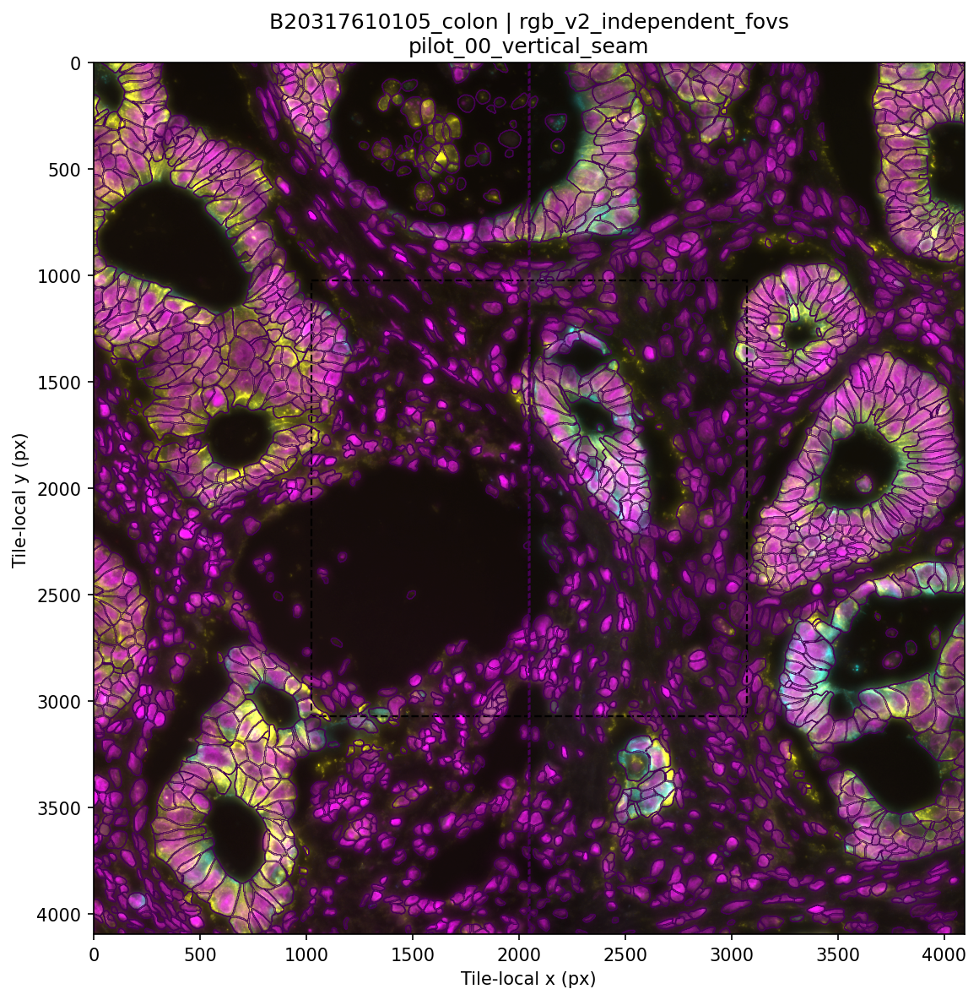

In [8]:
RUN_INDEPENDENT_FOV_CONTROL = True
if RUN_INDEPENDENT_FOV_CONTROL:
    sample_key = list(config["samples"])[0]
    tile_path = sorted(p.parent for p in (OUTPUT_ROOT / sample_key / "tiles").glob("*/complete.json"))[0]
    layout = pilot.read_json(OUTPUT_ROOT / sample_key / "alignment" / "layout.json")["layout"]
    source = pilot.load_source(config["samples"][sample_key]["source_zarr"])
    variant = next(v for v in config["variants"] if v["name"] == "rgb_v2_legacy_thresholds")
    model, model_info = pilot.load_cellpose_model("cpsam_v2", config["gpu_device"])
    control_path = pilot.run_independent_fov_control(
        tile_path, source, layout, variant, model, model_info,
        batch_size=config["cellpose_batch_size"],
    )
    print(control_path)
    pilot.plot_tile(tile_path, "rgb_v2_independent_fovs")
    del model, source
else:
    print("Independent-FOV ablation is optional and disabled.")

### Outputs and interpretation
Each completed method has `masks.npy`, `run.json`, and a completion marker. Direct Cellpose
runs also save the actual cell-probability field from `flows[2]`; no zero-filled substitute is
created. RGB quality can still vary with composite saturation and stain quality. A well-segmented
native sample is a useful benchmark, not a guarantee that every new disagreement is an error.

Sources: [models](https://cellpose.readthedocs.io/en/latest/models.html),
[thresholds and channels](https://cellpose.readthedocs.io/en/latest/settings.html),
[model API/flow ordering](https://github.com/MouseLand/cellpose/blob/main/cellpose/models.py).